# Reading off-axis rays from CSV files to plot Hyp and Par hits on the module shells

## Comparing Rays that have hit and have not hit the detector

### @Milo, Dec 2017

Reading 30arcmin off-axis rays

Defining customed function to read the rays:

In [7]:
from foxsisim.util import load_rays
import numpy as np
#Rrays0 = load_rays('/Users/Kamilobu/Desktop/MakeRays/30arcmin/run00.csv')
Rrays = load_rays('/Users/Kamilobu/Desktop/MakeRays/30arcmin/run01.csv')
#Rrays = Rrays0 + Rrays1
print('Number of rays0 : {:d}'.format(len(Rrays)))

Rays from /Users/Kamilobu/Desktop/MakeRays/30arcmin/run01.csv loaded.
Number of rays0 : 100000


In [8]:
prays = [ray.pos for ray in Rrays]
orays = [ray.ori for ray in Rrays]
srays = [ray.src for ray in Rrays]
drays = [ray.des for ray in Rrays]
trays = [ray.tag for ray in Rrays]
hrays = [ray.hist for ray in Rrays]
brays = [ray.bounces for ray in Rrays]
deadrays = [ray.dead for ray in Rrays]

Hrays = [ray for ray in Rrays if (ray.bounces ==1 and ray.hist[2] >= 30 )]
Prays = [ray for ray in Rrays if (ray.bounces ==1 and ray.hist[2] <= 30 )]
Hx, Hy = np.array([ray.hist[0] for ray in Hrays]), np.array([ray.hist[1] for ray in Hrays])
Px, Py = np.array([ray.hist[0] for ray in Prays]), np.array([ray.hist[1] for ray in Prays])

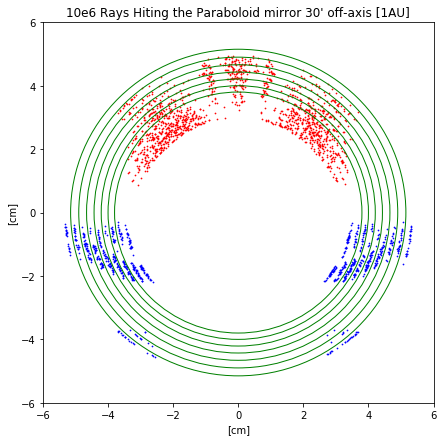

In [10]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(7,7))
ax = fig.gca()
# Plot Shells
FrontRadii = [5.345, 5.085, 4.835, 4.595, 4.365, 4.15, 3.94]
InterRadii = [5.15, 4.9, 4.66, 4.43, 4.21, 4.0, 3.8]
InnerRadii = [4.56, 4.335, 4.125, 3.92, 3.725, 3.54, 3.36 ]
for r in InterRadii:
    c = plt.Circle((0, 0), r, color='g',fill=False)
    ax.add_artist(c)

# Plot random points
plt.scatter(Px,Py,s=0.5,color='b')
plt.scatter(Hx,Hy,s=0.5,color='r')
plt.title('10e6 Rays Hiting the Paraboloid mirror 30\' off-axis [1AU]')
plt.xlabel('[cm]')
plt.ylabel('[cm]')
plt.xlim(-6,6);plt.ylim(-6,6)
plt.show()

## Rays in module:

Now, let's read the rays that interacted with the module but not with the detector:

In [11]:
Mrays1 = load_rays('/Users/Kamilobu/Desktop/Developer/Milo_RayTracing/1millionRays/rays_on_module_1M.csv')
Mrays2 = load_rays('/Users/Kamilobu/Desktop/Developer/Milo_RayTracing/1millionRays/rays_on_module_1M_2.csv')
Mrays3 = load_rays('/Users/Kamilobu/Desktop/Developer/Milo_RayTracing/1millionRays/rays_on_module_1M_3.csv')
Mrays = Mrays1 + Mrays2 + Mrays3
print('Number of rays0 : {:d}'.format(len(Mrays)))

Rays from /Users/Kamilobu/Desktop/Developer/Milo_RayTracing/1millionRays/rays_on_module_1M.csv loaded.
Rays from /Users/Kamilobu/Desktop/Developer/Milo_RayTracing/1millionRays/rays_on_module_1M_2.csv loaded.
Rays from /Users/Kamilobu/Desktop/Developer/Milo_RayTracing/1millionRays/rays_on_module_1M_3.csv loaded.
Number of rays0 : 2798550


In [12]:
Mprays = [ray.pos for ray in Mrays]
Morays = [ray.ori for ray in Mrays]
Msrays = [ray.src for ray in Mrays]
Mdrays = [ray.des for ray in Mrays]
Mtrays = [ray.tag for ray in Mrays]
Mhrays = [ray.hist for ray in Mrays]
Mbrays = [ray.bounces for ray in Mrays]
Mdeadrays = [ray.dead for ray in Mrays]

MHrays = [ray for ray in Mrays if (ray.bounces ==1 and ray.hist[2] >= 30 )]
MPrays = [ray for ray in Mrays if (ray.bounces ==1 and ray.hist[2] <= 30 )]
MHx, MHy = np.array([ray.hist[0] for ray in MHrays]), np.array([ray.hist[1] for ray in MHrays])
MPx, MPy = np.array([ray.hist[0] for ray in MPrays]), np.array([ray.hist[1] for ray in MPrays])

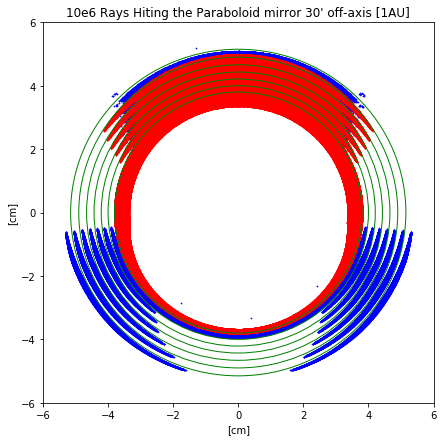

In [13]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(7,7))
ax = fig.gca()
# Plot Shells
FrontRadii = [5.345, 5.085, 4.835, 4.595, 4.365, 4.15, 3.94]
InterRadii = [5.15, 4.9, 4.66, 4.43, 4.21, 4.0, 3.8]
InnerRadii = [4.56, 4.335, 4.125, 3.92, 3.725, 3.54, 3.36 ]
for r in InterRadii:
    c = plt.Circle((0, 0), r, color='g',fill=False)
    ax.add_artist(c)

# Plot random points
plt.scatter(MPx,MPy,s=0.5,color='b')
plt.scatter(MHx,MHy,s=0.5,color='r')
plt.title('10e6 Rays Hiting the Paraboloid mirror 30\' off-axis [1AU]')
plt.xlabel('[cm]')
plt.ylabel('[cm]')
plt.xlim(-6,6);plt.ylim(-6,6)
plt.show()

From here a don't see any gap, as we saw on the old data. WTF? (Where is The Flux?)

Let's use Detector, catch rays and plot the rays again.

In [14]:
from foxsisim.detector import Detector
detector = Detector(width=10,
                    height=10,
                    normal = [0,0,1],
                    center = [0,0,230],
                    reso = [1024,1024])

When the rays are read, the hist parameter is a np.ndarray instead of a list. An intermediate step is needed before **detector.catchRays**.

In [ ]:
for ray in Mrays:
    ray.hist = ray.hist.tolist()

In [30]:
detector.catchRays(Mrays)

D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D


To double check that we are getting the same as before, we should plot the rays reaching the detector.

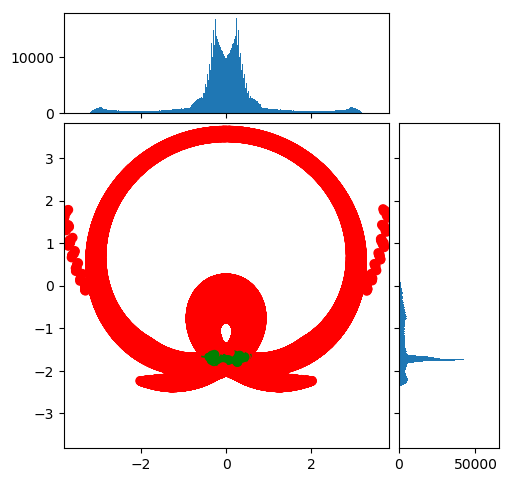

In [40]:
from foxsisim.plotting import scatterHist
drays = [ray for ray in Mrays if ray.des[2]==230.0]
scatterHist(drays)
plt.show()

# I don's see gaps!!!! Ahhhhh!

Let's save the rays on detector in a CSV file before I lost them.

In [58]:
from foxsisim.util import save_rays

In [72]:
%load_ext autoreload
%autoreload 2
save_rays(Mrays,filename='rays_on_detector_3Million.csv')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Rays saved in file : rays_on_detector_3Million.csv


### Let's plot the rays on detector in a fancy way:

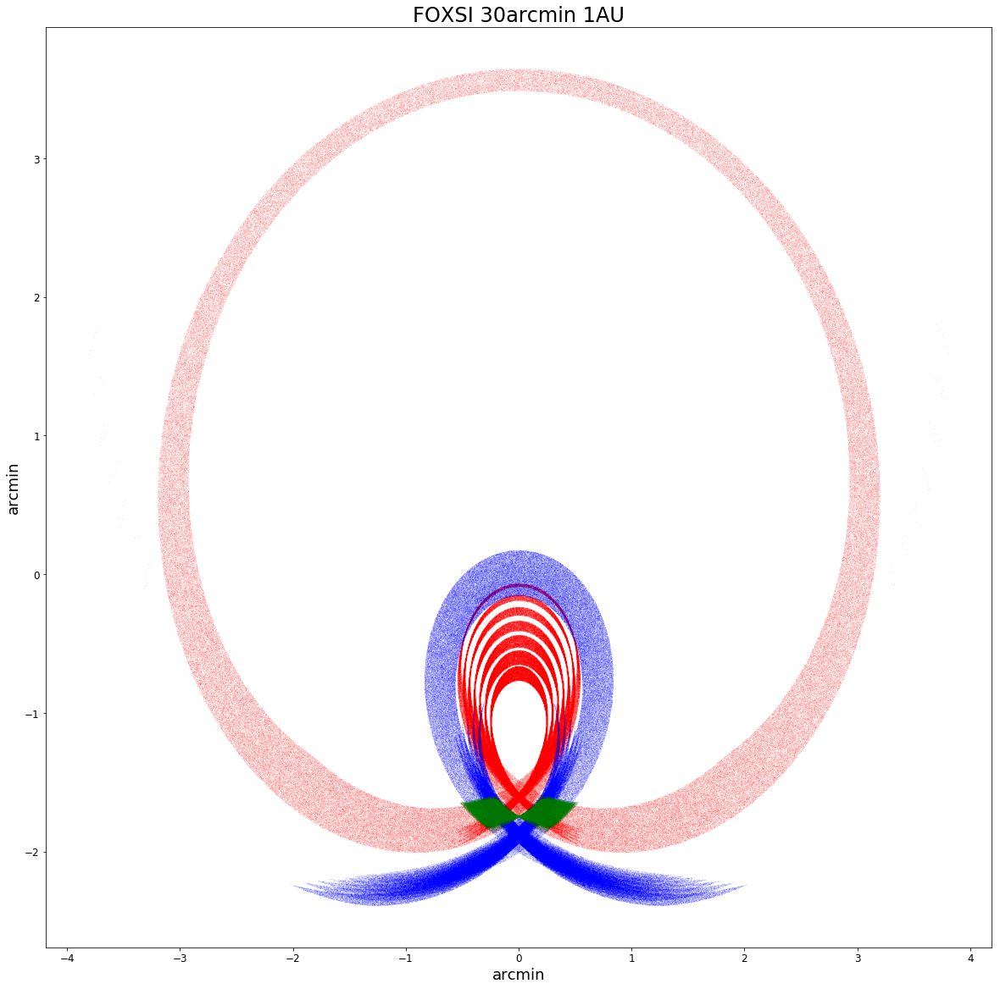

In [81]:
Drays = [ray for ray in Mrays if (ray.des[2]==230.0 and ray.bounces ==2 )]
Srays = [ray for ray in Mrays if (ray.des[2]==230.0 and ray.bounces ==1 )]
Hrays = [ray for ray in Mrays if (ray.des[2]==230.0 and ray.bounces ==1 and ray.tag[-4:] == 'Hy-D' )]
Prays = [ray for ray in Mrays if (ray.des[2]==230.0 and ray.bounces ==1 and ray.tag[-4:] == 'Pa-D' )]

sim_scale = 1.0    # 1cm = 17.4 arcmin
#sim_scale = 17.4    # 1cm = 17.4 arcmin

#Hyperboloid
Hx, Hy = [], []
for ray in Hrays:
    Hx.append(ray.pos[0]*sim_scale)
    Hy.append(ray.pos[1]*sim_scale)

# Paraboloid
Px, Py = [], []
for ray in Prays:
    Px.append(ray.pos[0]*sim_scale)
    Py.append(ray.pos[1]*sim_scale)

# Double
Dx, Dy = [], []
for ray in Drays:
    Dx.append(ray.pos[0]*sim_scale)
    Dy.append(ray.pos[1]*sim_scale)
    
    
    
fig = plt.figure(figsize=(20,20))
plt.title('FOXSI 30arcmin 1AU',fontsize=24)
plt.xlabel('arcmin',fontsize=18)
plt.ylabel('arcmin',fontsize=18)
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
#plt.axvline(x=0.0,color='gray')
#plt.axhline(y=0.0,color='gray')
plt.scatter(Hx,Hy,color='red',s=0.001,alpha=0.8)
plt.scatter(Px,Py,color='blue',s=0.001,alpha=0.8)
plt.scatter(Dx,Dy,color='green',s=0.001,alpha=0.8)
#plt.ylim(-50,10)
#plt.xlim(-50,10)
plt.show()

## Zoom

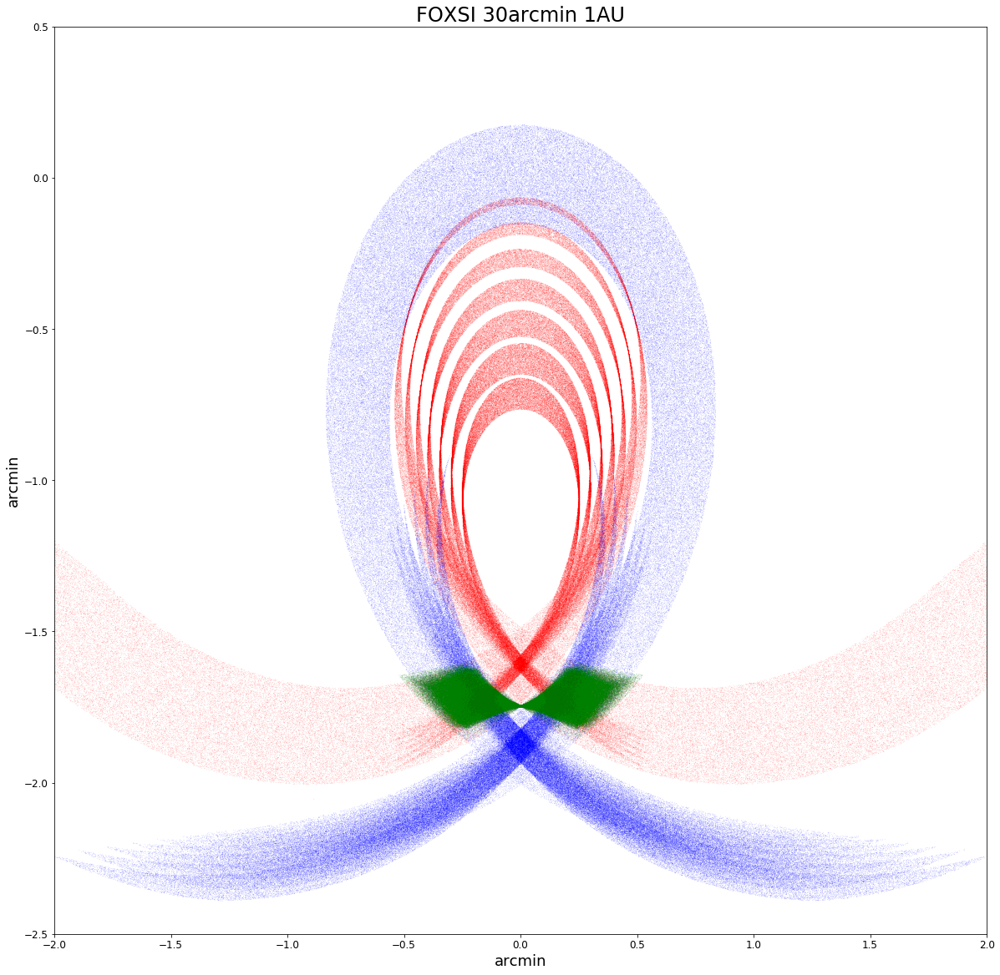

In [80]:
fig = plt.figure(figsize=(20,20))
plt.title('FOXSI 30arcmin 1AU',fontsize=24)
plt.xlabel('arcmin',fontsize=18)
plt.ylabel('arcmin',fontsize=18)
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
plt.scatter(Hx,Hy,color='red',s=0.001,alpha=0.8)
plt.scatter(Px,Py,color='blue',s=0.001,alpha=0.8)
plt.scatter(Dx,Dy,color='green',s=0.001,alpha=0.8)
plt.ylim(-2.5,0.5)
plt.xlim(-2.,2.)
plt.show()

# The gaps are pretty much gone! Why????

## The only difference between this simulation and the previous one is the size of the blocker.

### Possible plan:

Run the simulation with the exact pareameters I used a couple of weeks ago, i.e. blocker size by default, and reproduce the gaps. If by changing the blocker size we see change in the gaps size and apperance we could conclude that those blockers are a key piece for the FOXSI optics and Ghost Rays.